<a href="https://colab.research.google.com/github/Yuchen-PLB/STA-160-Practice-in-Data-Science/blob/main/STA141C_final_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from matplotlib.image import imread
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import random

# Set the seed value
random.seed(10043)

In [ ]:
import requests

image_urls = [
    "https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203191222-16N8MP7K7EACDQ1EVJ7E/shot_orange_marilyn_1964-19604.png?format=1000w",
    "https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203192094-MIQYNYEIJYJBY957F7T7/shot_red_marilyn_1964-19604.png?format=1000w",
    "https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652213792503-2Q9A294S9UOFEBQZQQNP/shot_turq_marilyn_1964-19604.png?format=1000w",
    "https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203207667-AHQD95AZ4Z1MCZ5B4C0N/shot_blue_marilyn_1964-19604.jpg?format=1000w",
    "https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203189304-UFR2YYN9605G0IW13YHJ/shot_eggblue_marilyn_1964-19604.png?format=1000w"
]

for i, url in enumerate(image_urls):
    response = requests.get(url)
    response.raise_for_status()
    image_name = f"Warhol[{i}].jpg"
    with open(image_name, "wb") as file:
        file.write(response.content)
    print(f"Image {image_name} downloaded successfully.")

Image Warhol[0].jpg downloaded successfully.
Image Warhol[1].jpg downloaded successfully.
Image Warhol[2].jpg downloaded successfully.
Image Warhol[3].jpg downloaded successfully.
Image Warhol[4].jpg downloaded successfully.


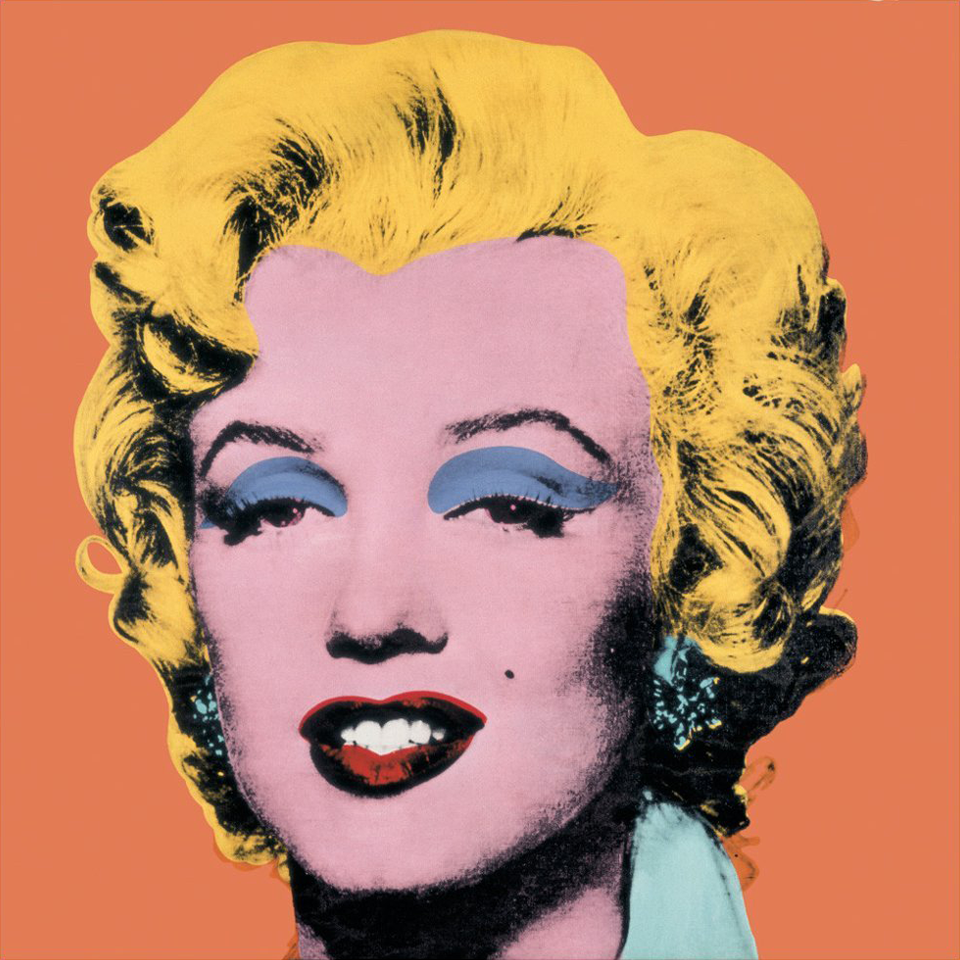

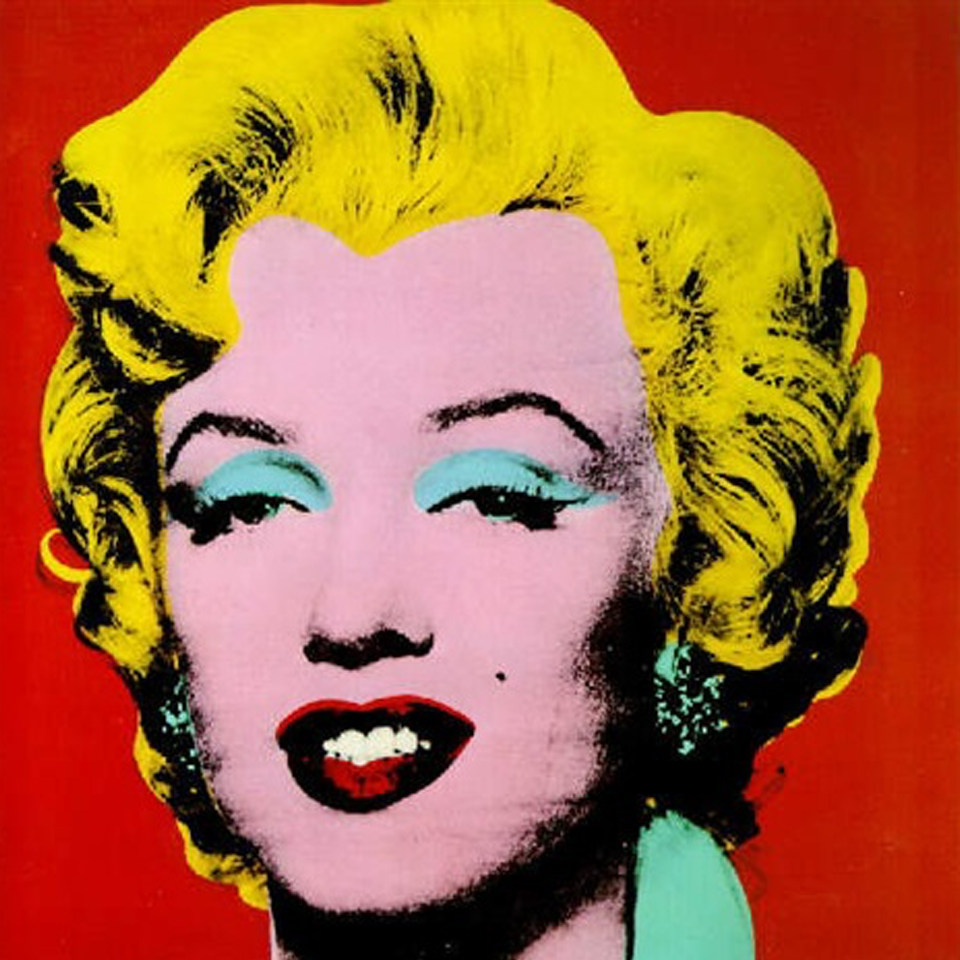

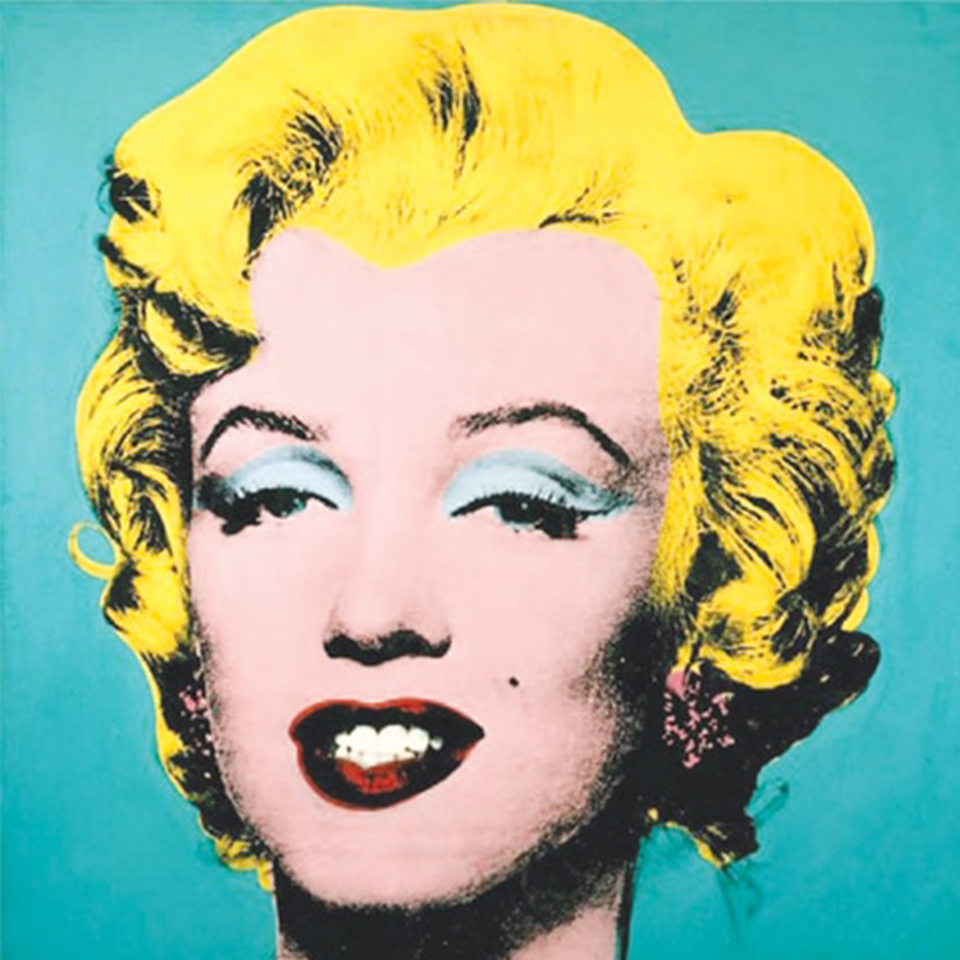

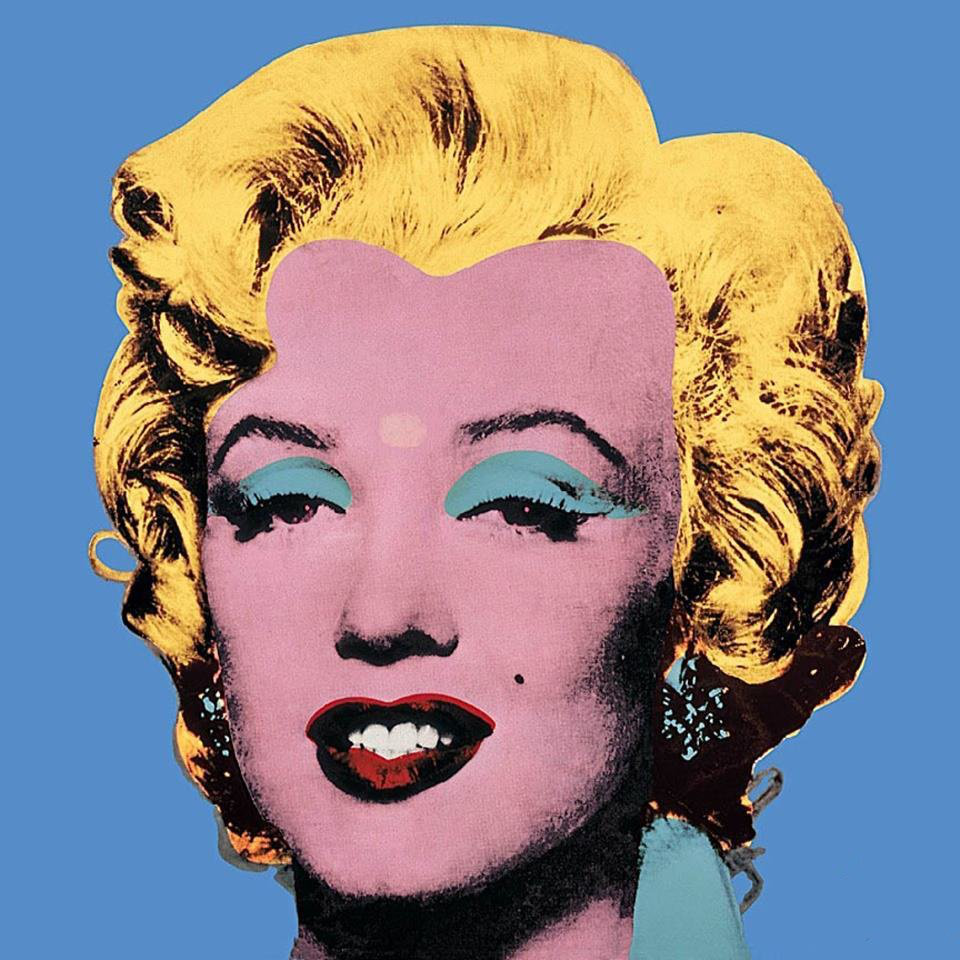

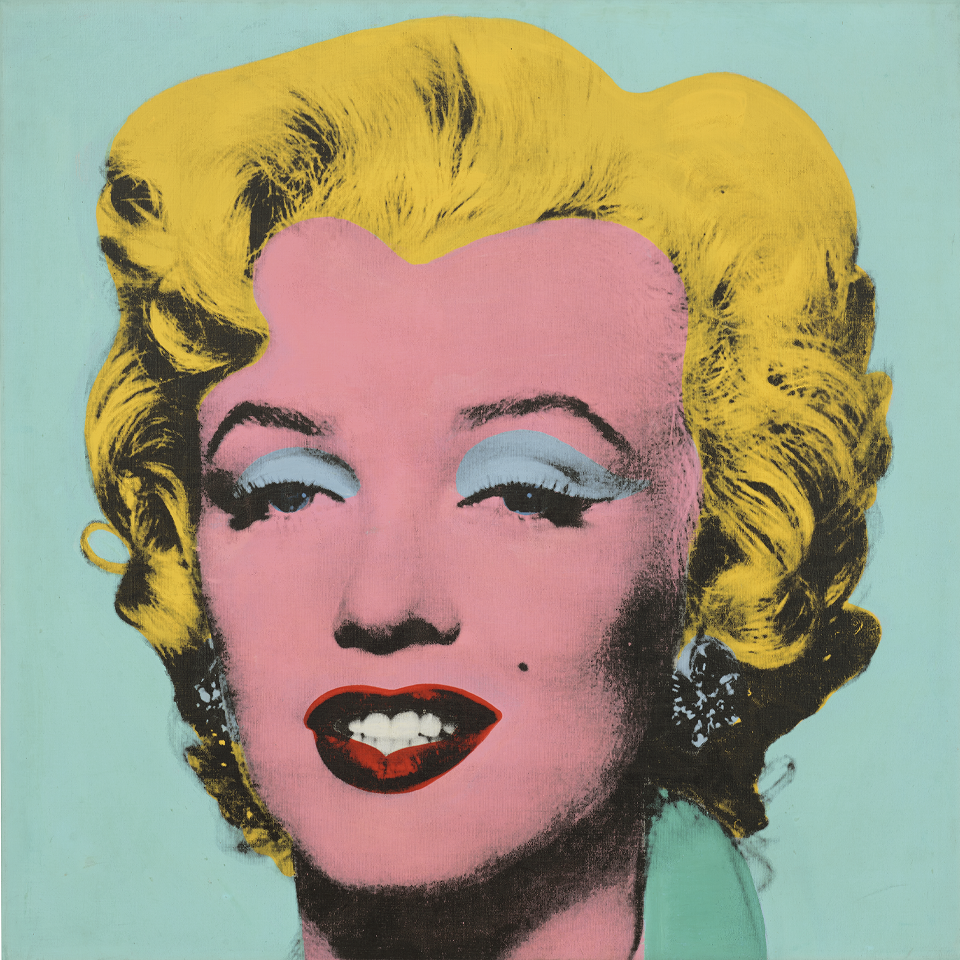

In [ ]:
from PIL import Image

image_names = [
    "Warhol[0].jpg",
    "Warhol[1].jpg",
    "Warhol[2].jpg",
    "Warhol[3].jpg",
    "Warhol[4].jpg"
]

for image_name in image_names:
    image = Image.open(image_name)
    image.show()


In [ ]:

df_list = []  # List to store individual DataFrames

for i in range(5):  # Loop through values 0 to 4
    image = Image.open(f"Warhol[{i}].jpg")  # Replace 'Warhol[i].jpg' with the actual filename pattern

    # Convert the image to RGB mode if it's not already in RGB
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Extract the pixel values from the image
    pixels = list(image.getdata())

    # Create a DataFrame from the pixel values
    df = pd.DataFrame(pixels, columns=['R', 'G', 'B'])
    df_list.append(df)  # Append the DataFrame to the list

df_list[0]

,R,G,B
0,208,118,111
1,222,114,105
2,223,106,94
3,219,113,96
4,206,122,98
...,...,...,...
921595,214,121,71
921596,216,121,67
921597,216,117,61
921598,224,122,60


## Decision Tree

CART (Classification And Regression Tree):

* Spliting the data into two subsets using a single feature t and a threshold value v. 

* Searching for the pair (t,v) such that the lost function can decrease the most. 

* Recursively finding the optimal split from the top level to the bottom.

* Stop recursing once it reaches the maximum depth or cannot find a split that will reduce the cost.


Lost function:

$$L(t,v)= \frac{n_{left}}{n} C_{left} + \frac{n_{right}}{n} C_{right}$$


Criteria $C$ is used to measure the quality of a split. Supported criteria are "gini" for the Gini index and "entropy" for the information gain.

Gini Index:
$$Gini= \sum_{k=1}^{K} p_k (1-p_k)$$

Entropy:
$$H= -\sum_{k=1}^{K} p_k log(p_k)$$

where $p_k$ is the ratio of class k samples among all the samples in the node,

$$\hat{p}_k=\frac{1}{|node|}\sum_{x_i \in node} I(y_i=k)$$


Gini index and entropy work pretty simialr. Howeber, gini is slightly faster and entropy tends to produce slightly more balanced trees.

Decision:

Operate tree descend and end at a tree leaf. Make a decision according to the estimated probability of the tree leaf.


Stop criteria:

* max_depth: 
The maximum depth of the tree.

* min_samples_split (default=2): 
The minimum number of samples required to split an internal node

* min_samples_leaf (default=1): 
The minimum number of samples required to be at a leaf node.

* min_impurity_decrease (default=0):
A node will be split if this split induces a decrease of the impurity greater than or equal to this value.
    
* min_impurity_split (default=1e-7):
Threshold for early stopping in tree growth. A node will split if its impurity is above the threshold, otherwise it is a leaf.

Note: CART does not require feautre scaling or centering.

In [ ]:
X=df_list[0]
X.columns = range(X.shape[1])
X.reset_index(drop=True, inplace=True)
X.dropna()
array = X.values
print(array)

[[208 118 111]
 [222 114 105]
 [223 106  94]
 ...
 [216 117  61]
 [224 122  60]
 [228 120  53]]


In [ ]:
X=array

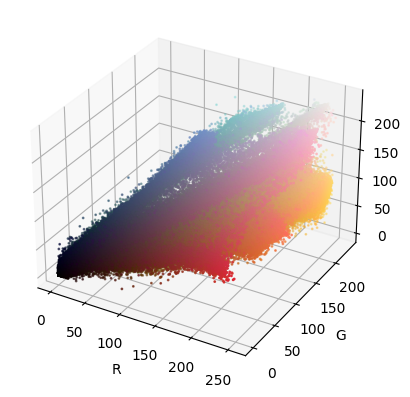

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D



# Generate random initial centroids
np.random.seed(42)  # Set a seed for reproducibility
n_clusters = 9  # Number of clusters
max_coordinate = 255  # Maximum coordinate value in the 3D space

# Generate random initial centroids
initial_centroids = np.random.randint(0, max_coordinate, size=(n_clusters, 3))

# Create an instance of KMeans with random initialization
kmeans = KMeans(n_clusters=n_clusters, init=initial_centroids, n_init=1)
kmeans.fit(X)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Plotting the clusters in 3D with original colors
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=X / 255.0, s=1)
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c=centroids / 255.0, s=100, marker='X')
ax.set_xlabel('R')
ax.set_ylabel('G')
ax.set_zlabel('B')
plt.show()



In [ ]:
labels
centroids

array([[193.51872764, 144.37360688, 154.15384161],
       [ 64.90113022,  57.01274669,  51.85418415],
       [137.34162999, 102.64236726,  67.13816654],
       [162.59987051, 201.84331499, 201.07154419],
       [239.09891977, 191.72549646,  88.30118086],
       [122.30647597, 123.26007741, 147.72217502],
       [225.55630278, 172.61472552, 185.44624707],
       [ 14.78302121,  17.68141175,  19.65995231],
       [225.18253018, 124.22616568,  83.62685311]])

In [ ]:
df = pd.DataFrame(X)
df['Labels'] = labels

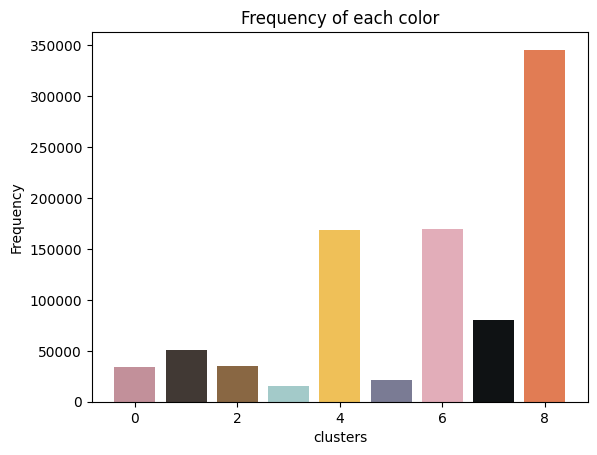

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate the frequency of each element
unique_elements, element_counts = np.unique(labels, return_counts=True)

# Plot the frequency histogram with colored bars
fig, ax = plt.subplots()
ax.bar(unique_elements, element_counts, color=centroids/ 255.0)

# Add labels and title to the plot
ax.set_xlabel('clusters')
ax.set_ylabel('Frequency')
ax.set_title('Frequency of each color')

# Display the plot
plt.show()


In [ ]:

# Get unique values from column X[:, 3]
unique_values = df.iloc[:, 3].unique()
unique_values

array([8, 0, 6, 4, 2, 1, 7, 5, 3], dtype=int32)

In [ ]:

# Create a dictionary to store the subsets
subsets = {}

# Iterate over unique values and create subsets
for value in unique_values:
    # Subset based on the value
    subset = df.copy()
    subset.loc[subset.iloc[:, 3] != value, :] = np.nan
    
    # Store the subset in the dictionary
    subsets[value] = subset

# Access subsets by their respective values
for value, subset in subsets.items():
    print(f"Subset for value {value}:\n{subset}\n")


Subset for value 8:
            0      1      2  Labels
0       208.0  118.0  111.0     8.0
1       222.0  114.0  105.0     8.0
2       223.0  106.0   94.0     8.0
3       219.0  113.0   96.0     8.0
4       206.0  122.0   98.0     8.0
...       ...    ...    ...     ...
921595  214.0  121.0   71.0     8.0
921596  216.0  121.0   67.0     8.0
921597  216.0  117.0   61.0     8.0
921598  224.0  122.0   60.0     8.0
921599  228.0  120.0   53.0     8.0

[921600 rows x 4 columns]

Subset for value 0:
         0   1   2  Labels
0      NaN NaN NaN     NaN
1      NaN NaN NaN     NaN
2      NaN NaN NaN     NaN
3      NaN NaN NaN     NaN
4      NaN NaN NaN     NaN
...     ..  ..  ..     ...
921595 NaN NaN NaN     NaN
921596 NaN NaN NaN     NaN
921597 NaN NaN NaN     NaN
921598 NaN NaN NaN     NaN
921599 NaN NaN NaN     NaN

[921600 rows x 4 columns]

Subset for value 6:
         0   1   2  Labels
0      NaN NaN NaN     NaN
1      NaN NaN NaN     NaN
2      NaN NaN NaN     NaN
3      NaN NaN NaN  

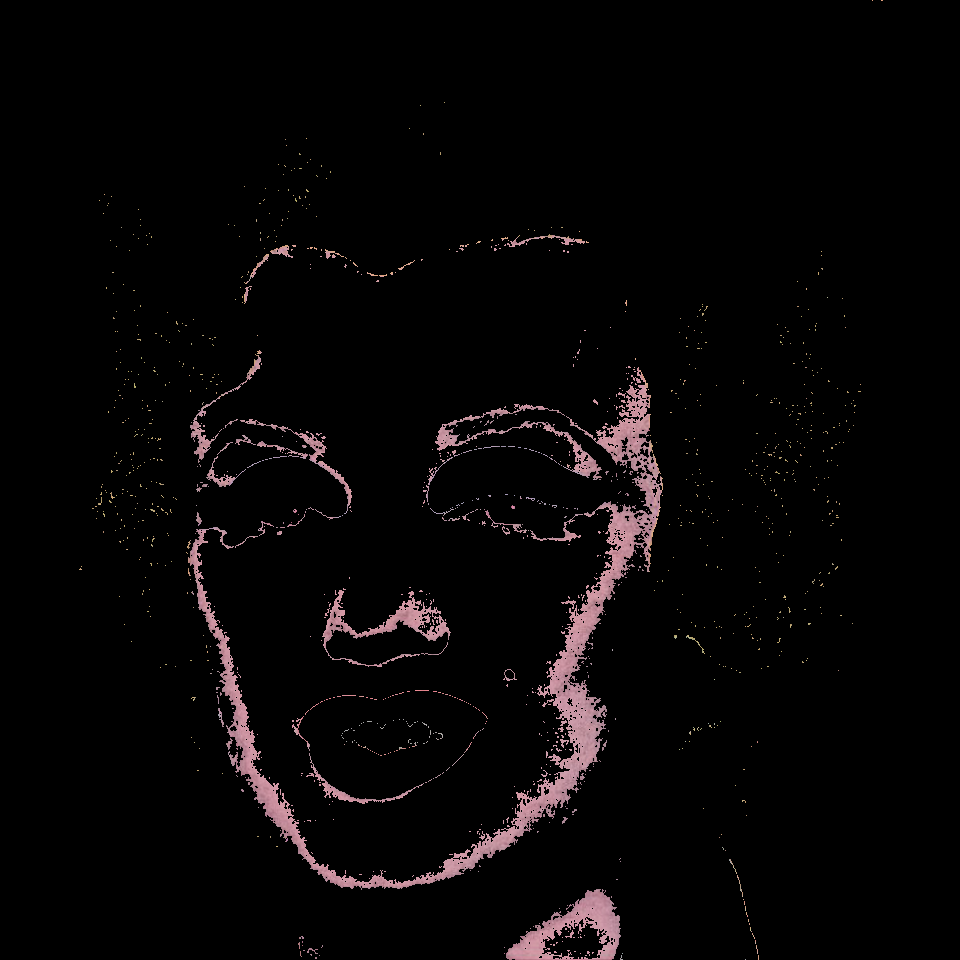

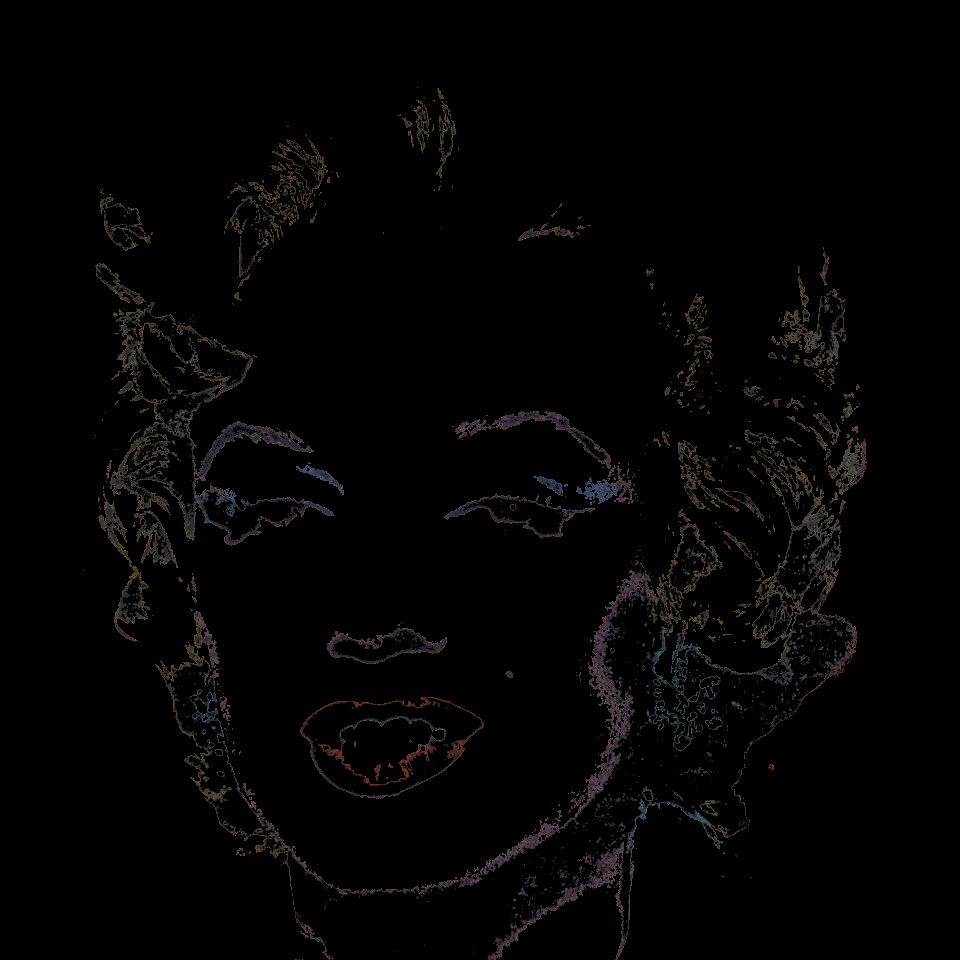

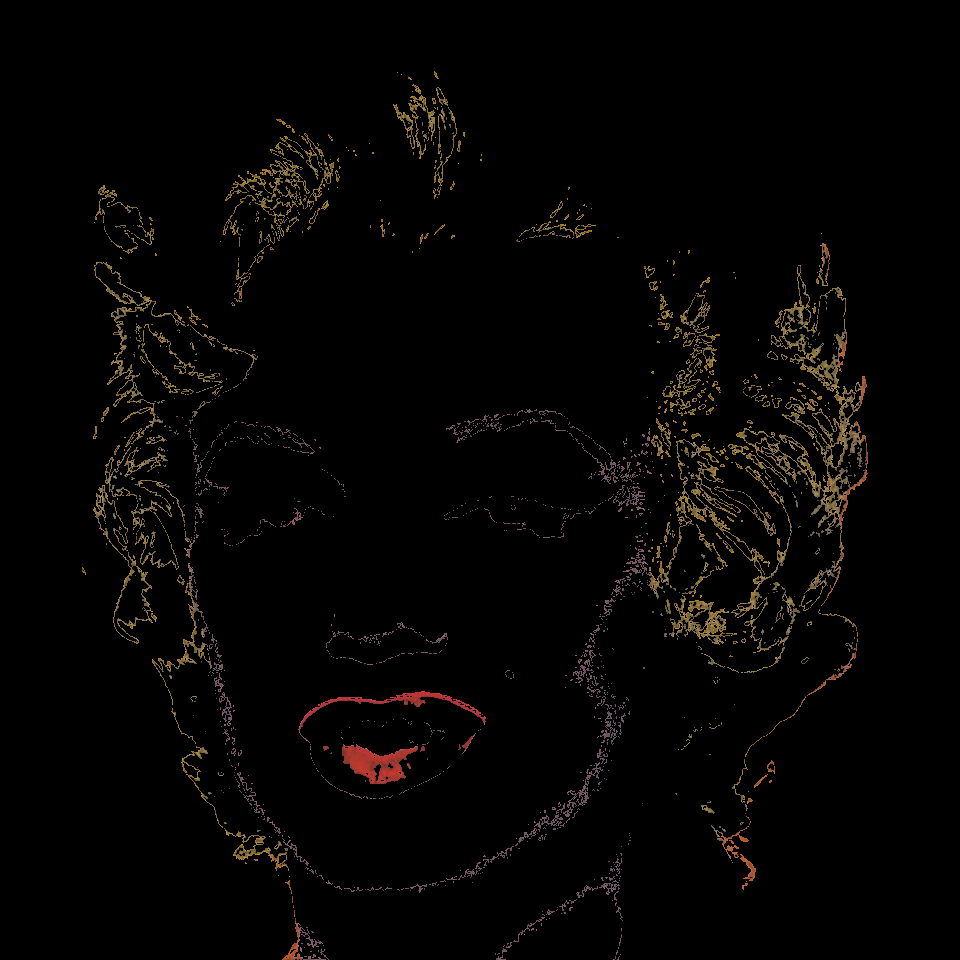

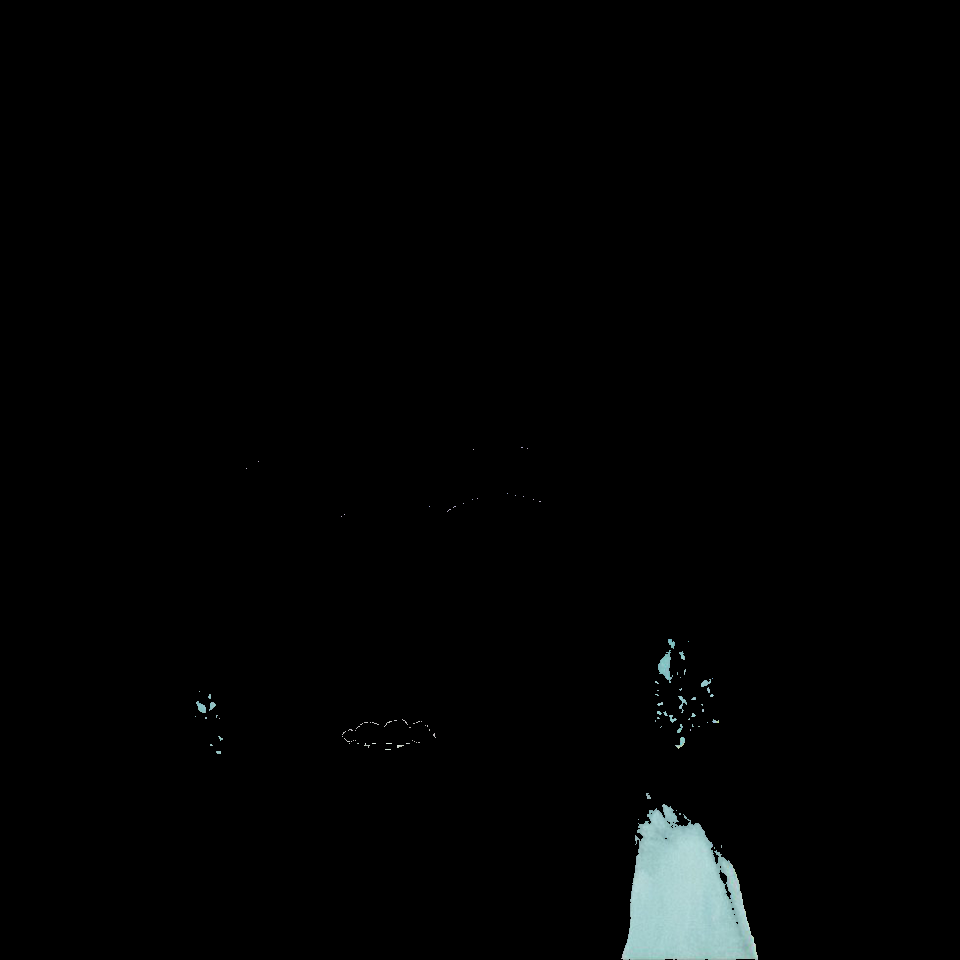

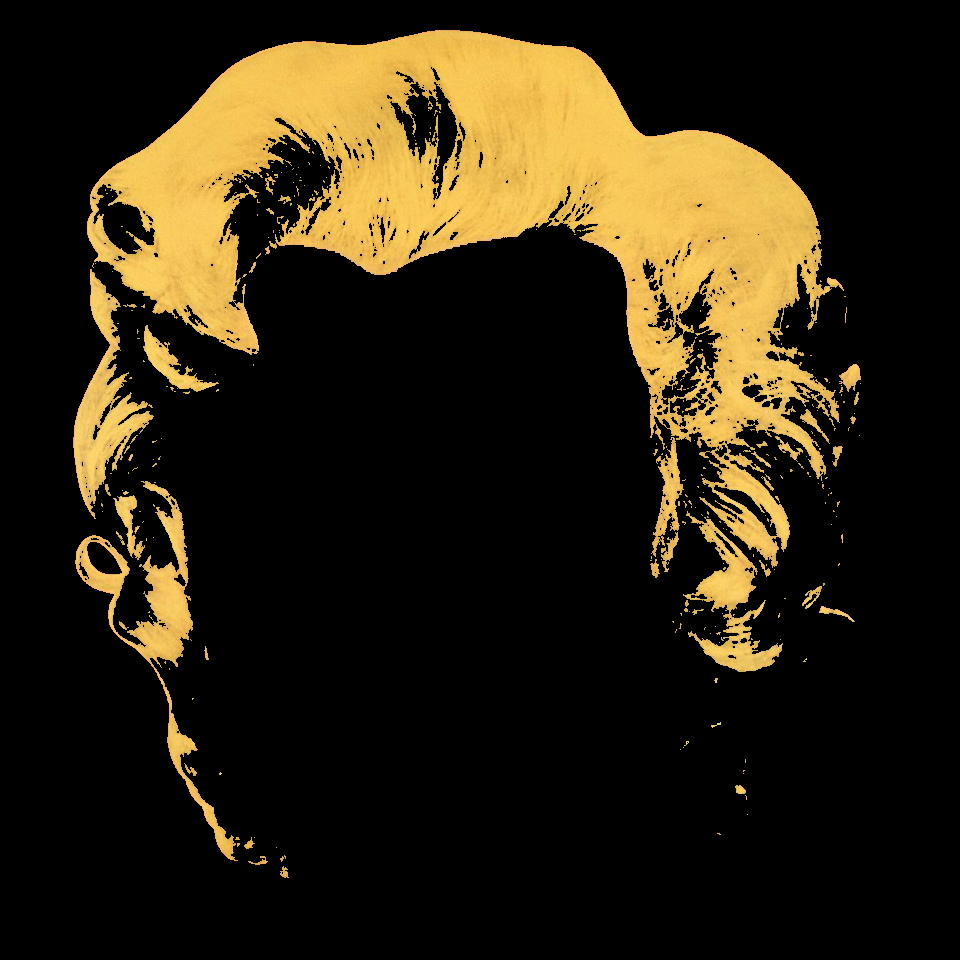

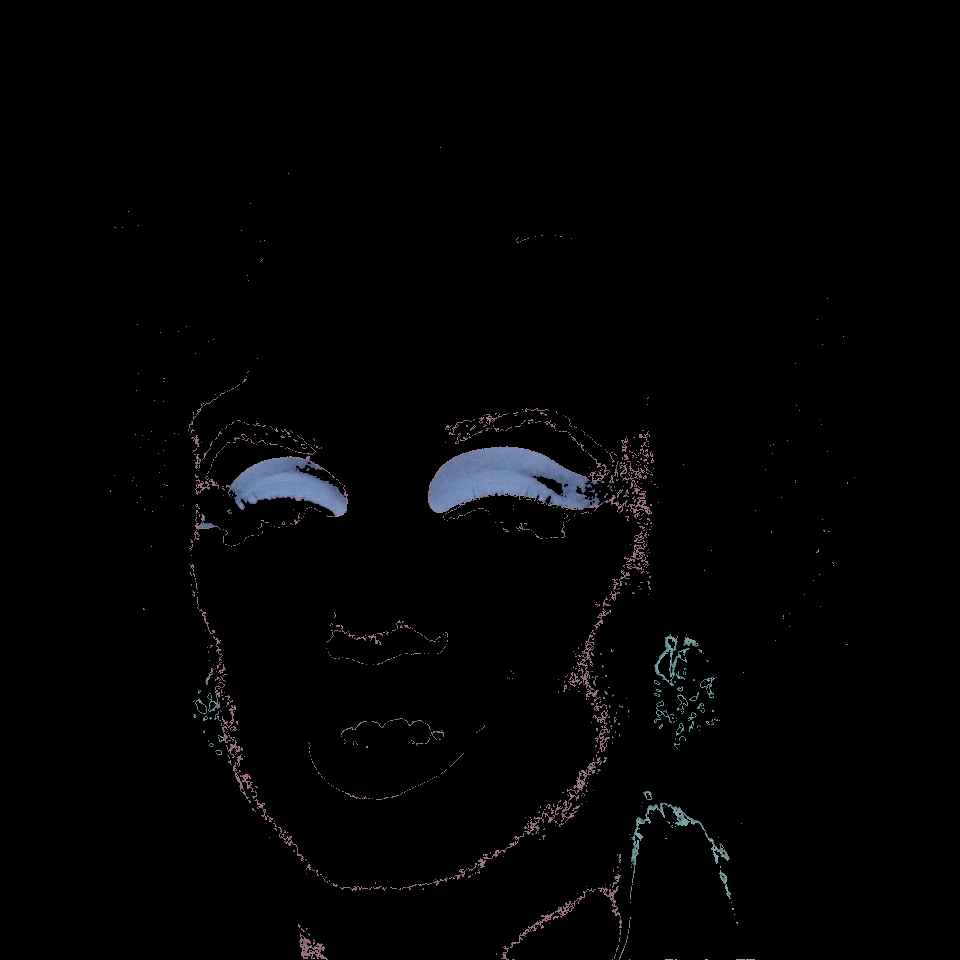

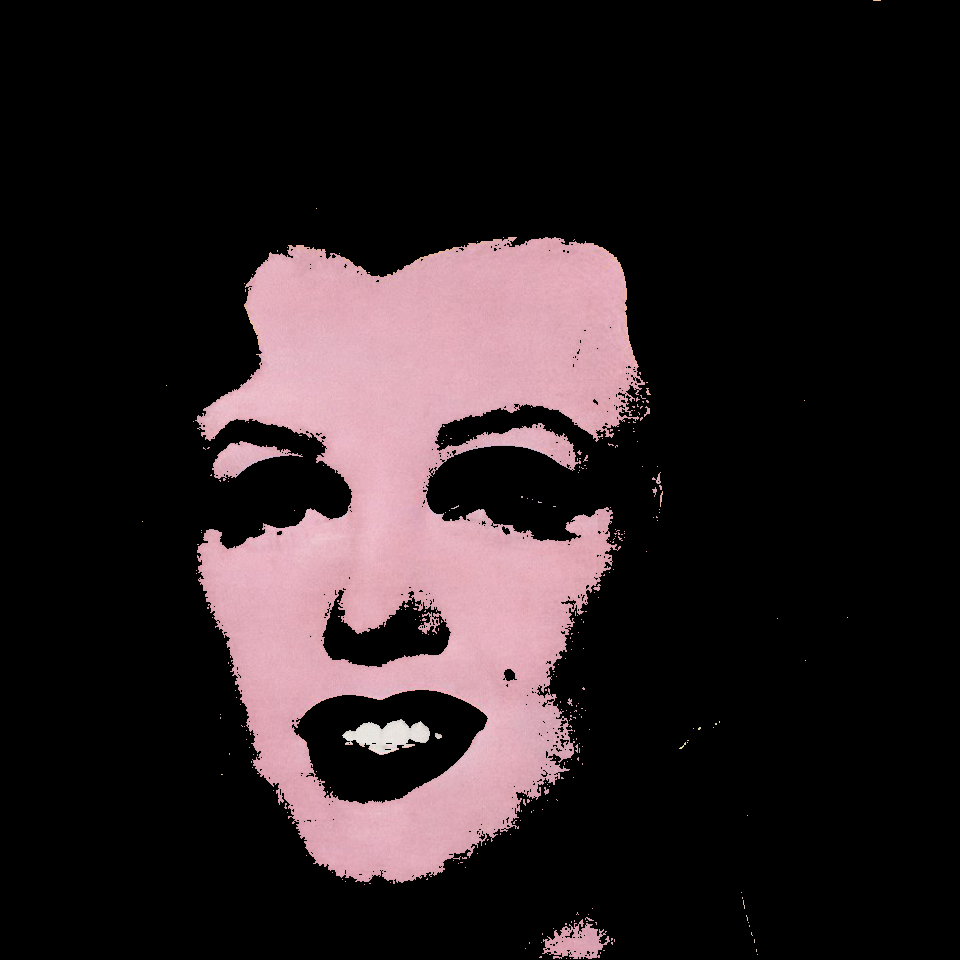

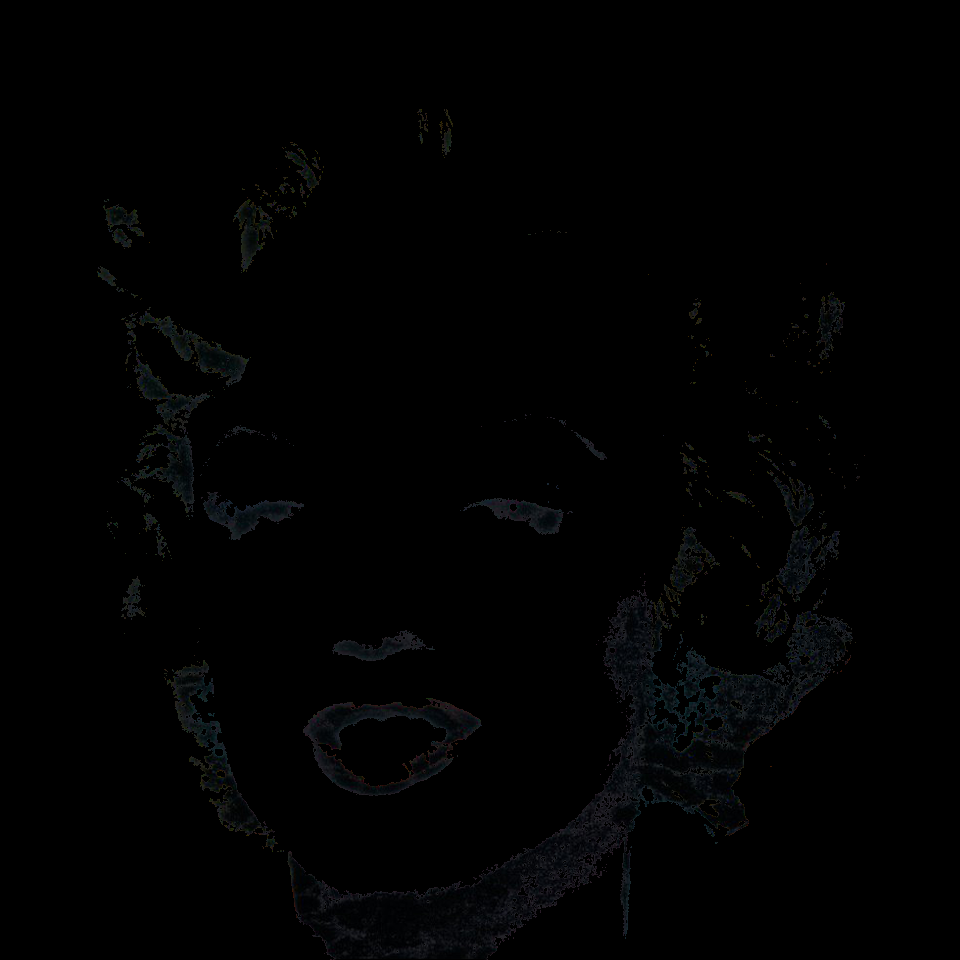

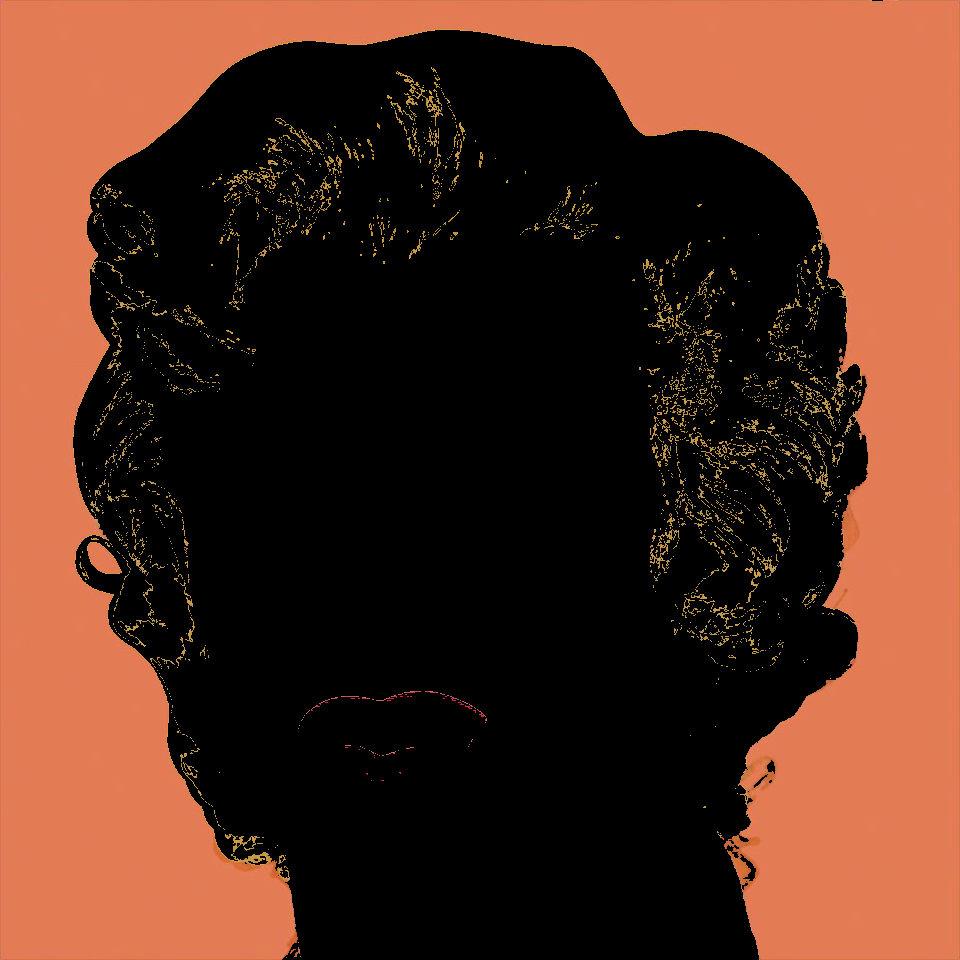

In [ ]:
# Create empty arrays to store reshaped arrays and images
reshaped_arrays = []
images = []

# Loop through subsets[0] to subsets[4]
for i in range(n_clusters):
    # Drop the 'Labels' column from the subset
    subset = subsets[i].drop(columns=['Labels'])
    
    # Convert the DataFrame to a NumPy array
    array = subset.values.astype(np.uint8)
    
    # Reshape the array to match the image dimensions
    reshaped_array = array.reshape(960, 960, 3)
    
    # Append the reshaped array to the list
    reshaped_arrays.append(reshaped_array)
    
    # Create an image from the array
    image = Image.fromarray(reshaped_array)
    
    # Append the image to the list
    images.append(image)
    
    # Display the image
    image.show()

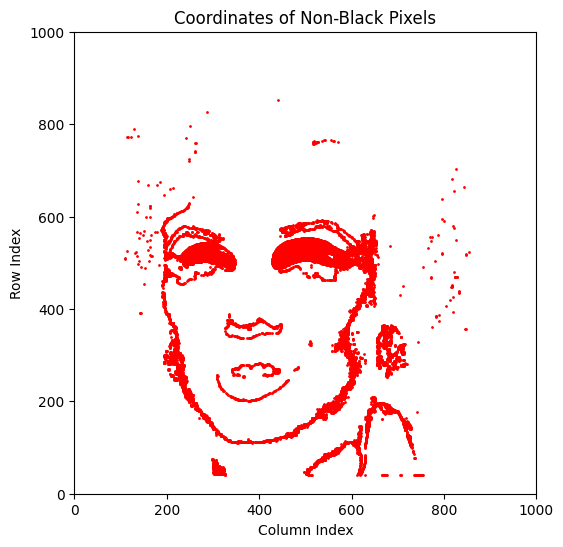

In [ ]:
image=images[5]

array = np.array(image)

# Get the coordinates of non-black pixels
row_coords, col_coords = np.nonzero((array != [0, 0, 0]).any(axis=2))

# Set the figure size to create a square plot
plt.figure(figsize=(6, 6))  # Adjust the size as needed

# Plot the coordinates
plt.scatter(col_coords, 1000 - row_coords, color='red', s=1)  # Invert the y-axis
plt.xlabel('Column Index')
plt.ylabel('Row Index')
plt.title('Coordinates of Non-Black Pixels')
plt.ylim(1000, 0)  # Set the y-axis limits from 1000 to 0
plt.xlim(0, 1000)  # Set the x-axis limits from 0 to 1000
plt.gca().invert_yaxis()  # Invert the y-axis
plt.gca().set_aspect('equal')  # Set aspect ratio to make it square
plt.show()

In [ ]:
import numpy as np                              # import numpy
from numpy.linalg import inv                    # for matrix inverse
import matplotlib.pyplot as plt                 # import matplotlib.pyplot for plotting framework
from scipy.stats import multivariate_normal     # for generating pdf

In [ ]:
# Assign col_coords to x and row_coords to y
x = col_coords
y = row_coords  # Invert the y-axis
df = pd.DataFrame({'x': x, 'y': y})
array = df.values

indices = np.random.permutation(len(array))
split_idx = len(array) // 2
x, y = np.split(array[indices], [split_idx])
d = np.concatenate((x, y), axis=0)
d

array([[451, 504],
       [296, 496],
       [523, 488],
       ...,
       [298, 474],
       [439, 475],
       [483, 461]])

In [ ]:
m1 = random.choice(d)
m2 = random.choice(d)
cov1 = np.cov(np.transpose(d))
cov2 = np.cov(np.transpose(d))
pi = 0.5

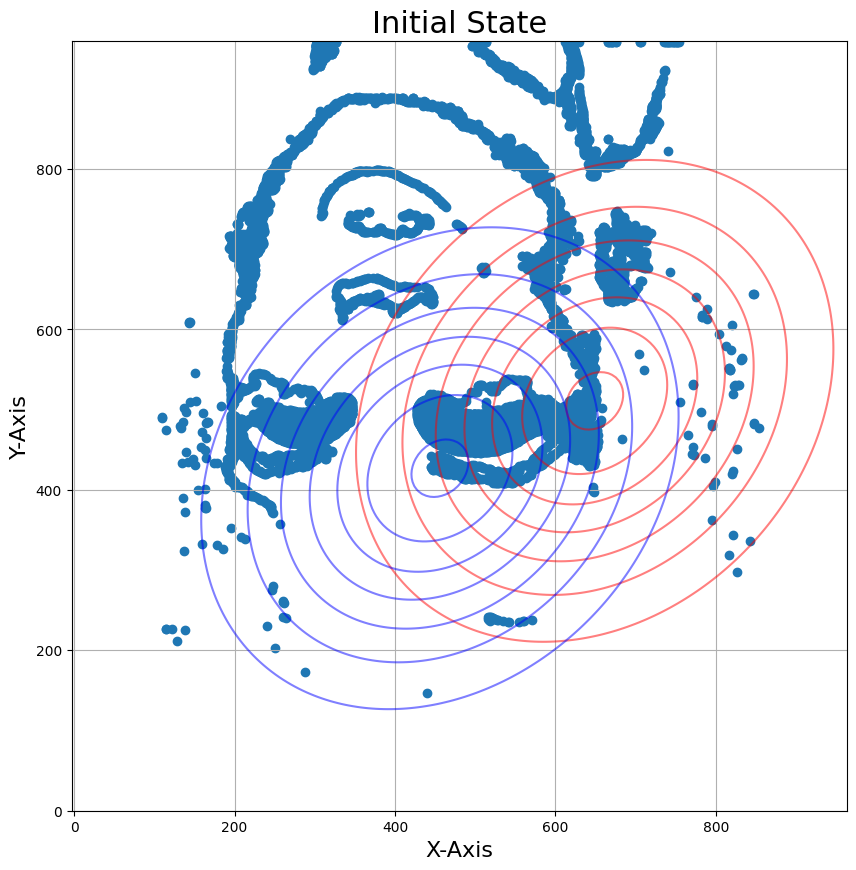

In [ ]:
x1 = np.linspace(0,960,200)  
x2 = np.linspace(0,960,200)
X, Y = np.meshgrid(x1,x2) 

Z1 = multivariate_normal(m1, cov1)  
Z2 = multivariate_normal(m2, cov2)

pos = np.empty(X.shape + (2,))                # a new array of given shape and type, without initializing entries
pos[:, :, 0] = X; pos[:, :, 1] = Y   

plt.figure(figsize=(10,10))                                                          # creating the figure and assigning the size
plt.scatter(d[:,0], d[:,1], marker='o')     
plt.contour(X, Y, Z1.pdf(pos), colors="r" ,alpha = 0.5) 
plt.contour(X, Y, Z2.pdf(pos), colors="b" ,alpha = 0.5) 
plt.axis('equal')                                                                  # making both the axis equal
plt.xlabel('X-Axis', fontsize=16)                                                  # X-Axis
plt.ylabel('Y-Axis', fontsize=16)                                                  # Y-Axis
plt.title('Initial State', fontsize=22)                                            # Title of the plot
plt.grid()                                                                         # displaying gridlines
plt.show()

In [ ]:
##Expectation step
def Estep(lis1):
    m1=lis1[0]
    m2=lis1[1]
    cov1=lis1[2]
    cov2=lis1[3]
    pi=lis1[4]
    
    pt2 = multivariate_normal.pdf(d, mean=m2, cov=cov2)
    pt1 = multivariate_normal.pdf(d, mean=m1, cov=cov1)
    w1 = pi * pt2
    w2 = (1-pi) * pt1
    eval1 = w1/(w1+w2)

    return(eval1)


In [ ]:
## Maximization step
def Mstep(eval1):
    num_mu1,din_mu1,num_mu2,din_mu2=0,0,0,0

    for i in range(0,len(d)):
        num_mu1 += (1-eval1[i]) * d[i]
        din_mu1 += (1-eval1[i])

        num_mu2 += eval1[i] * d[i]
        din_mu2 += eval1[i]

    mu1 = num_mu1/din_mu1
    mu2 = num_mu2/din_mu2

    num_s1,din_s1,num_s2,din_s2=0,0,0,0
    for i in range(0,len(d)):

        q1 = np.matrix(d[i]-mu1)
        num_s1 += (1-eval1[i]) * np.dot(q1.T, q1)
        din_s1 += (1-eval1[i])

        q2 = np.matrix(d[i]-mu2)
        num_s2 += eval1[i] * np.dot(q2.T, q2)
        din_s2 += eval1[i]

    s1 = num_s1/din_s1
    s2 = num_s2/din_s2

    pi = sum(eval1)/len(d)
    
    lis2=[mu1,mu2,s1,s2,pi]
    return(lis2)

In [ ]:
def plot(lis1):
    mu1=lis1[0]
    mu2=lis1[1]
    s1=lis1[2]
    s2=lis1[3]
    Z1 = multivariate_normal(mu1, s1)  
    Z2 = multivariate_normal(mu2, s2)

    pos = np.empty(X.shape + (2,))                # a new array of given shape and type, without initializing entries
    pos[:, :, 0] = X; pos[:, :, 1] = Y   

    plt.figure(figsize=(10,10))                                                          # creating the figure and assigning the size
    plt.scatter(d[:,0], d[:,1], marker='o')     
    plt.contour(X, Y, Z1.pdf(pos), colors="r" ,alpha = 0.5) 
    plt.contour(X, Y, Z2.pdf(pos), colors="b" ,alpha = 0.5) 
    plt.axis('equal')                                                                  # making both the axis equal
    plt.xlabel('X-Axis', fontsize=16)                                                  # X-Axis
    plt.ylabel('Y-Axis', fontsize=16)                                                  # Y-Axis
    plt.grid()                                                                         # displaying gridlines
    plt.show()

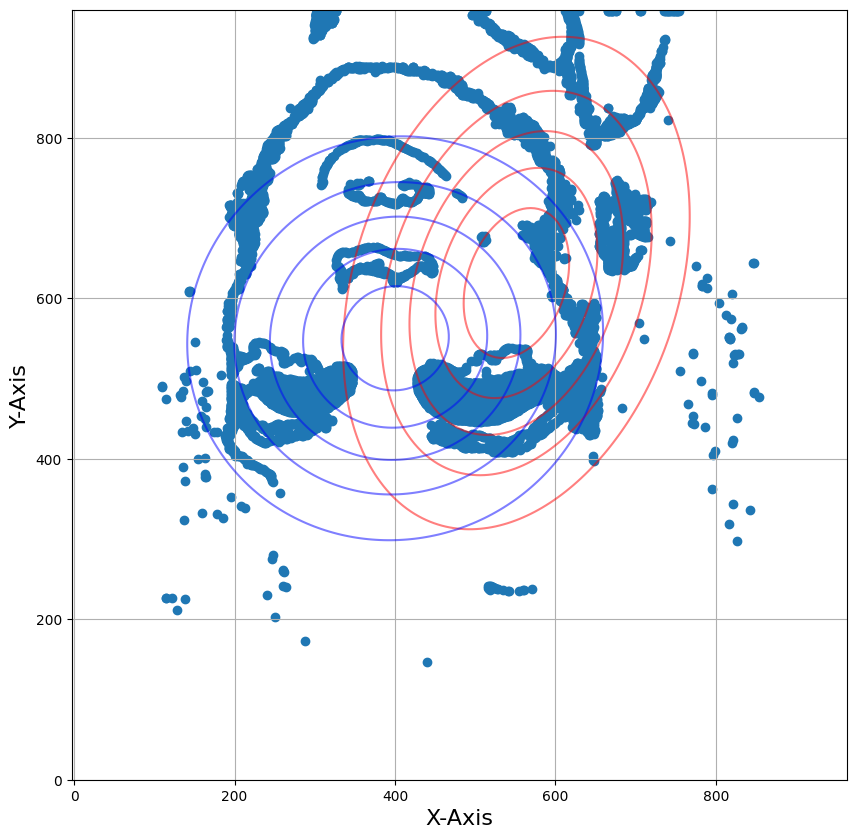

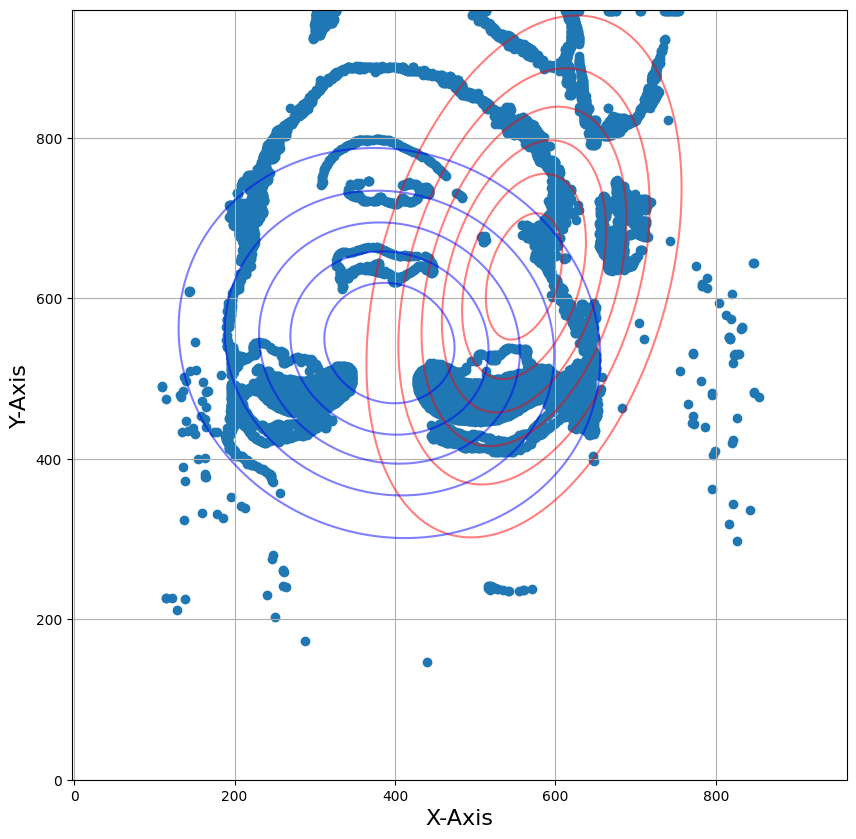

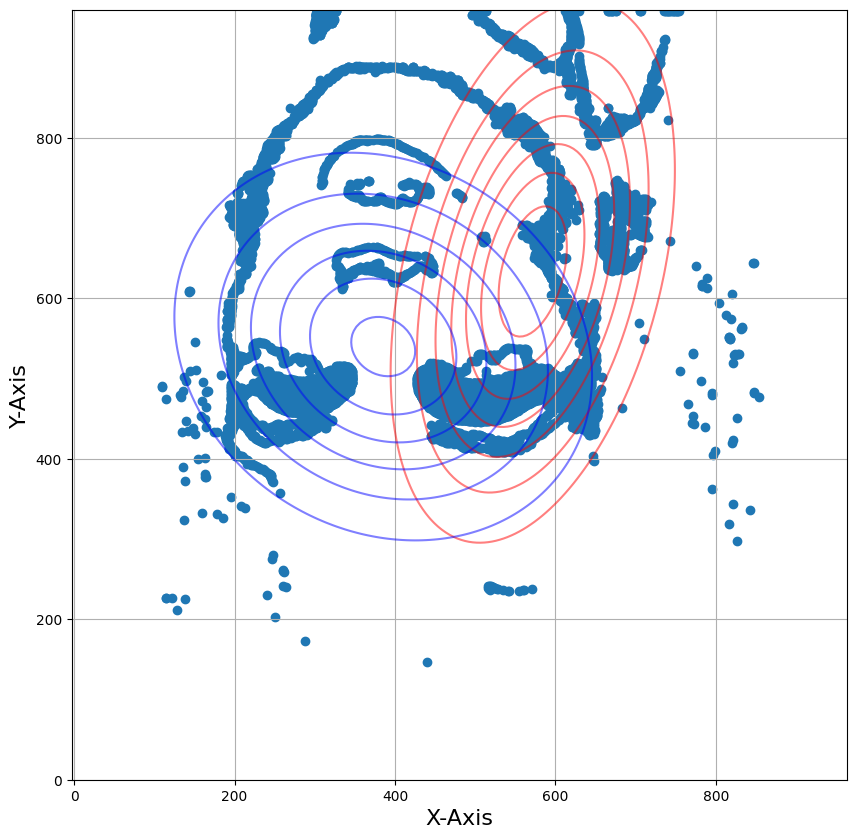

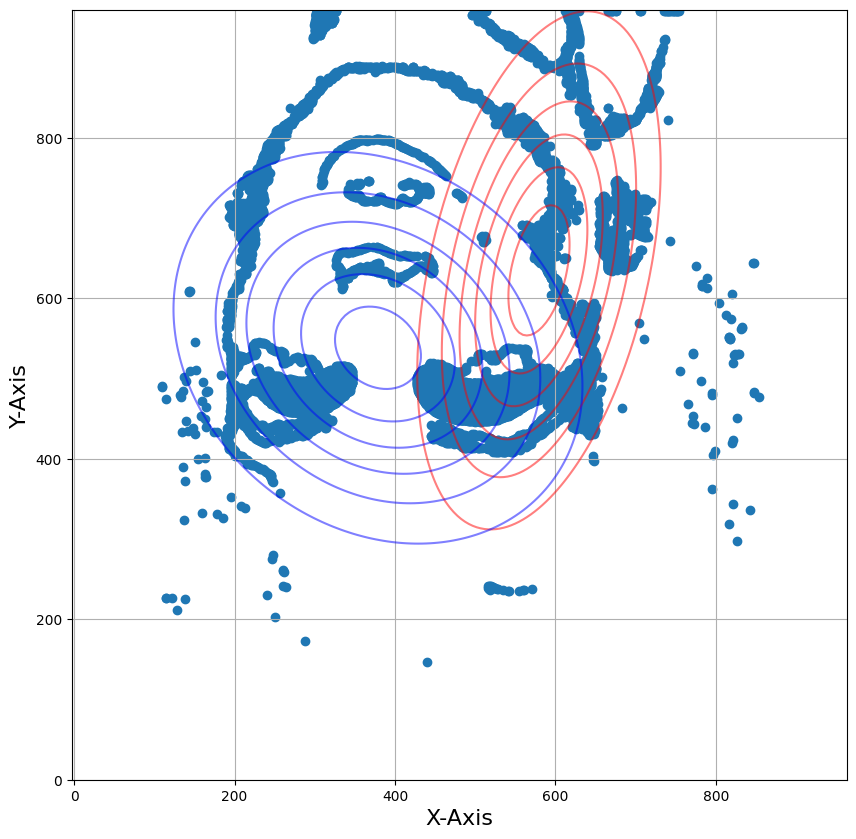

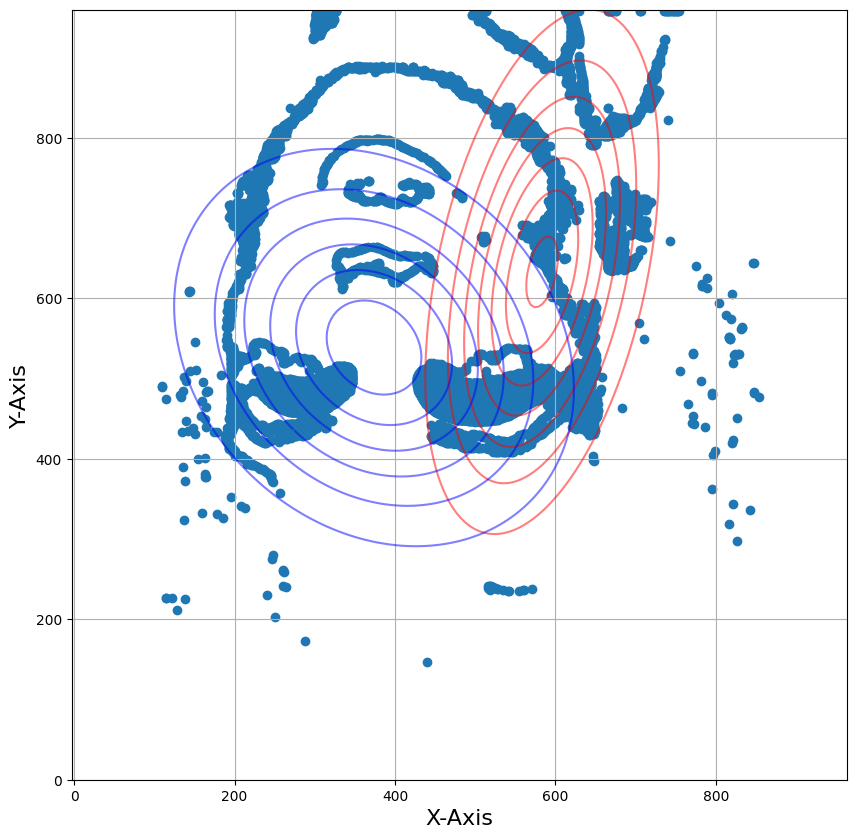

...

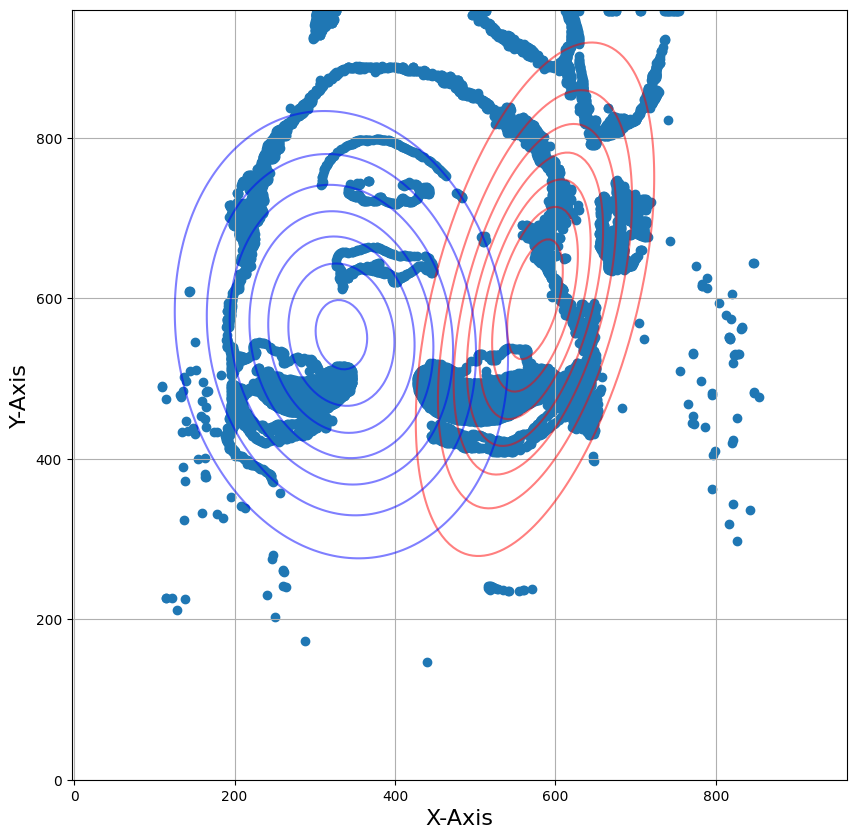

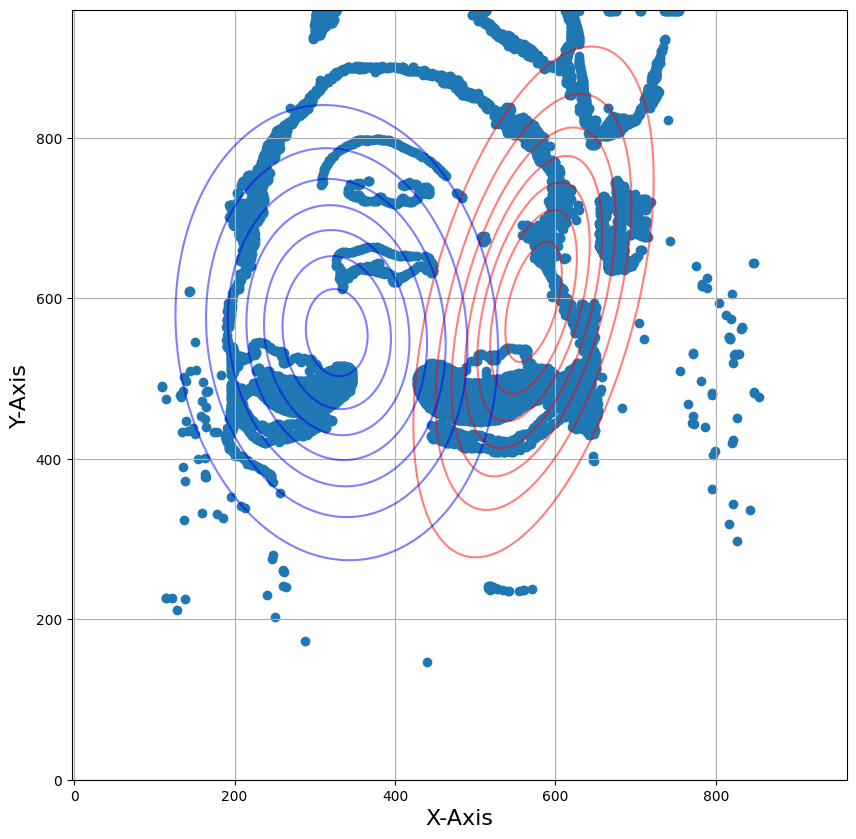

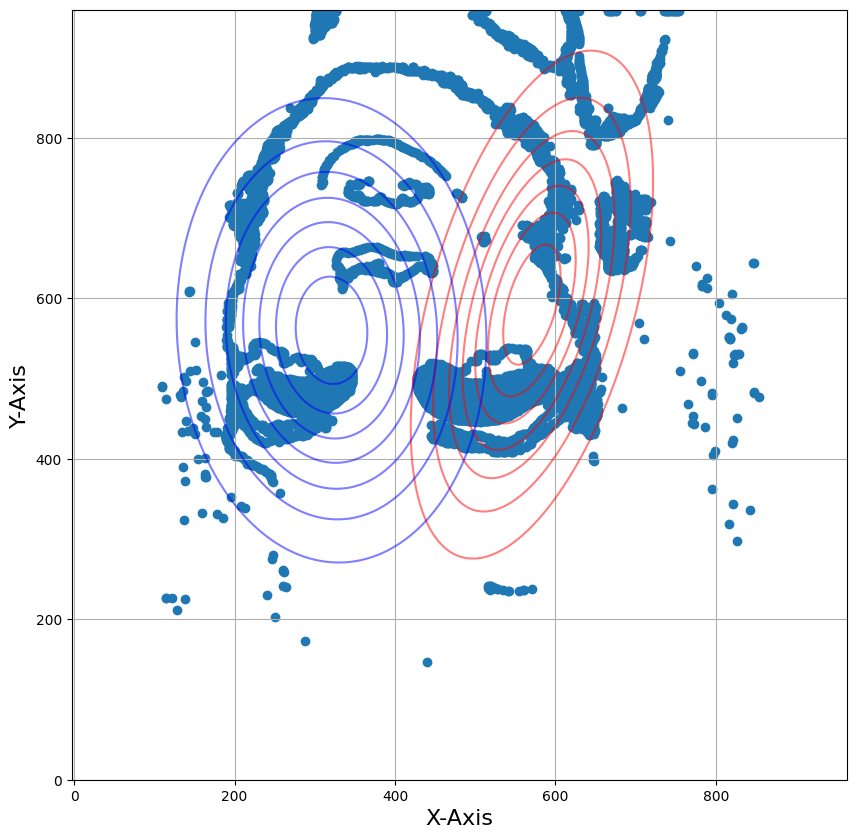

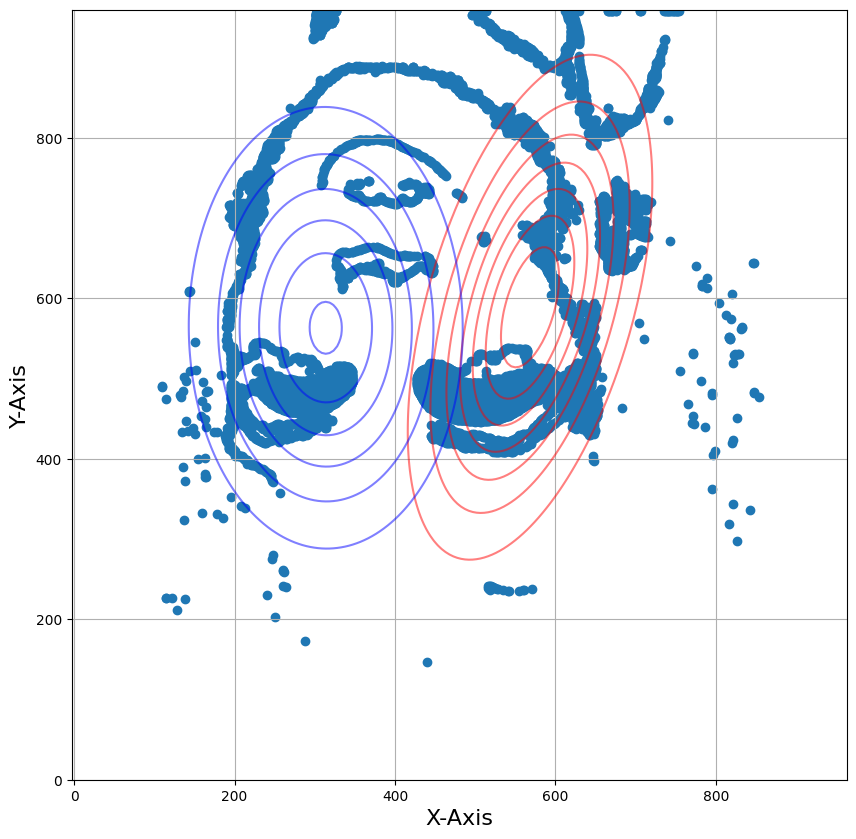

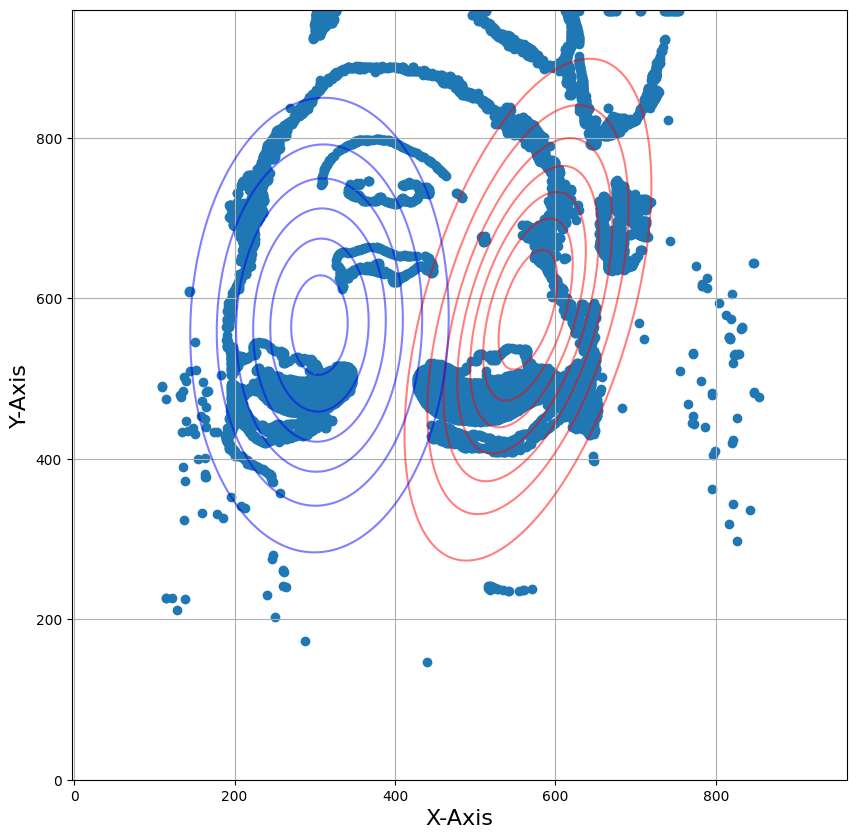

34.52823996543884


In [ ]:
import time
iterations = 20
start_time = time.time()
lis1=[m1,m2,cov1,cov2,pi]
for i in range(0,iterations):
    lis2 = Mstep(Estep(lis1))
    lis1=lis2
    plot(lis1)
elapsed_time = time.time() - start_time
print(elapsed_time)

In [ ]:
def SVM_region(X, Y, model, svc=False):
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1

    x1, x2 = np.meshgrid(np.arange(x1_min, x1_max, 0.1),
                             np.arange(x2_min, x2_max, 0.1))

    #Z = model.predict(np.c_[x1.ravel(), x2.ravel()])
    Z = model.decision_function(np.c_[x1.ravel(), x2.ravel()])

    Z = Z.reshape(x1.shape)
    
    plt.figure(figsize=(10,10))
    
    plt.contourf(x1, x2, Z, levels=[-1, 0, 1], alpha=0.2, colors='b',
               linestyles=['--', '-', '--'])
    plt.scatter(X[:, 0], X[:, 1], c=Y, s=20, edgecolor='k')

    if svc==True:
        plt.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=100, 
                    linewidth=1, facecolors='none', edgecolors='k')
        
    plt.show()

In [ ]:
X

array([[  0.        ,   4.8241206 ,   9.64824121, ..., 950.35175879,
        955.1758794 , 960.        ],
       [  0.        ,   4.8241206 ,   9.64824121, ..., 950.35175879,
        955.1758794 , 960.        ],
       [  0.        ,   4.8241206 ,   9.64824121, ..., 950.35175879,
        955.1758794 , 960.        ],
       ...,
       [  0.        ,   4.8241206 ,   9.64824121, ..., 950.35175879,
        955.1758794 , 960.        ],
       [  0.        ,   4.8241206 ,   9.64824121, ..., 950.35175879,
        955.1758794 , 960.        ],
       [  0.        ,   4.8241206 ,   9.64824121, ..., 950.35175879,
        955.1758794 , 960.        ]])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


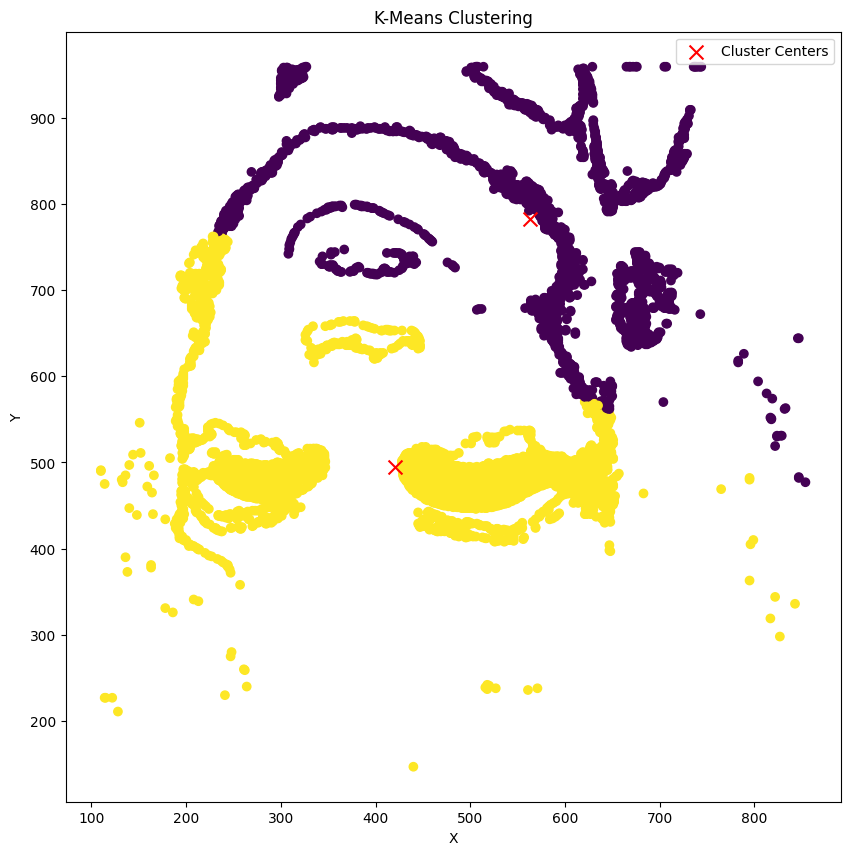

0.337146520614624

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

start_time = time.time()
# Specify the number of clusters
n_clusters = 2

# Perform K-means clustering
kmeans = KMeans(n_clusters=n_clusters)
kmeans.fit(x)

# Get the cluster labels
labels = kmeans.labels_

# Get the cluster centers
centers = kmeans.cluster_centers_
elapsed_time = time.time() - start_time
# Plot the clusters
plt.figure(figsize=(10,10))
plt.scatter(x[:, 0], x[:, 1], c=labels, cmap='viridis')

plt.scatter(centers[:, 0], centers[:, 1], marker='x', color='red', s=100, label='Cluster Centers')
plt.title('K-Means Clustering')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.show()
elapsed_time